In [137]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from arch.unitroot.cointegration import engle_granger
from statsmodels.tsa.stattools import adfuller

from pykrx import stock
from pykrx import bond

In [146]:
ticks = ['ATVI', 'AMZN', 'AAPL', 'BA', 'KO', 'DIS', 'XOM', 'F', 'GE', 'GS',
       'INTC', 'MCD', 'MSFT', 'NVDA', 'PFE', 'SBUX', 'UNH', 'WMT', 'ELV',
       'GOOGL', 'TSLA', 'GM', 'META', 'AAL', 'BABA']

In [150]:
df_close

,AAL,AAPL,AMZN,ATVI,BA,BABA,DIS,ELV,F,GE,...,MCD,META,MSFT,NVDA,PFE,SBUX,TSLA,UNH,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,,
2014-09-19,34.620152,22.621565,16.566000,20.655457,112.476151,93.889999,83.279411,109.215218,11.636472,173.921875,...,76.398048,77.910004,41.214790,4.564608,21.385998,32.671768,17.288000,77.692856,64.515495,66.696426
2014-09-22,33.627762,22.643965,16.225000,20.532394,111.832695,89.889999,82.175041,109.018333,11.433795,172.532608,...,76.049904,76.800003,40.815830,4.519153,21.231232,32.040417,16.668667,77.666328,64.070518,66.298111
2014-09-23,33.391479,22.997988,16.181499,20.144278,110.763153,87.169998,81.273132,106.816841,11.301008,172.135666,...,75.709831,78.290001,40.382172,4.500015,21.139771,31.765543,16.694000,76.622139,63.474403,65.947876
2014-09-24,34.138138,22.798576,16.410500,20.078014,111.806618,90.570000,82.322289,111.121384,11.468738,171.540253,...,76.916206,78.540001,40.833176,4.526330,21.322678,32.349655,16.809334,78.055664,64.717026,65.803673
2014-09-25,33.278065,21.929199,16.096500,19.888687,110.554451,88.919998,81.052261,108.007080,11.321975,169.026413,...,76.236084,77.220001,39.931168,4.428246,21.090530,31.834267,16.463333,76.259346,63.910992,64.725479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-14,14.680000,148.279999,98.489998,73.959999,173.550003,71.330002,94.279999,490.799988,14.060000,85.830002,...,272.269989,114.220001,240.871185,162.949997,49.240002,97.419998,190.949997,513.750000,138.389999,113.370003
2022-11-15,14.610000,150.039993,98.940002,73.879997,175.350006,79.300003,95.510002,479.010010,14.300000,87.139999,...,267.839996,117.080002,241.290009,166.660004,48.570000,97.830002,194.419998,503.010010,147.440002,114.129997
2022-11-16,14.090000,148.789993,97.120003,74.349998,172.690002,78.160004,93.949997,476.140015,13.900000,84.900002,...,272.510010,113.230003,241.729996,159.100006,48.049999,97.070000,186.919998,511.519989,148.500000,112.910004


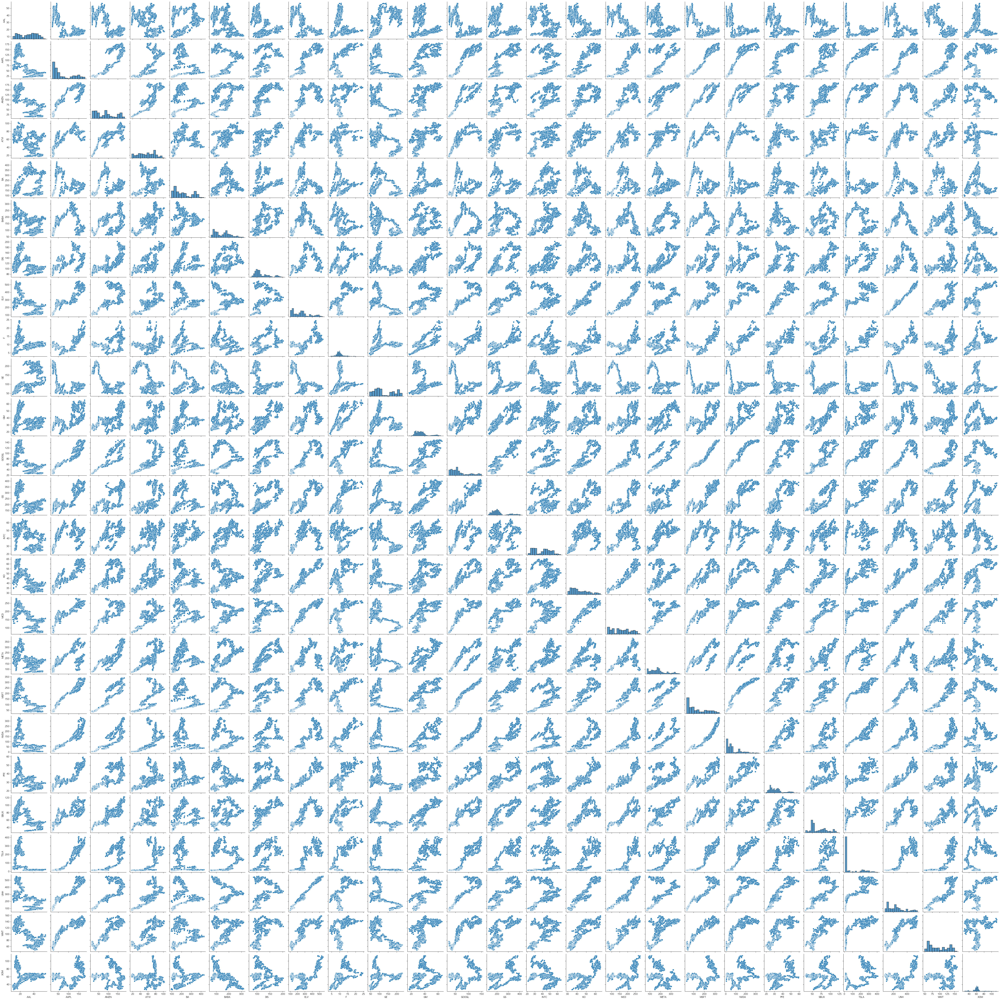

In [151]:
import seaborn as sns

sns.pairplot(df_close)

In [138]:
stock_list = stock.get_market_ticker_list()

In [143]:
# tmp = pd.DataFrame()
# for x in stock_list[:30]:
#     tmp[x] = stock.get_market_ohlcv("2012-01-01", "2022-01-01", x)['종가']

KeyError: '종가'

,095570,006840,027410,282330,138930,001460,001465,001040,079160,00104K,...,016610,005830,000990,000995,139130,001530,000210,001880,000215,375500
날짜,,,,,,,,,,,,,,,,,,,,,
2021-01-25,4195,30100,5950,155500.0,5630,318000,149500,108000,29950,83600.0,...,5290,40550,70300,132500,6920,192058,74600,38800,42950,127500.0
2021-01-26,4185,29950,6780,160500.0,5580,316500,151000,104500,29800,81000.0,...,5130,39800,67300,127000,6860,195005,70100,37650,41400,126500.0
2021-01-27,4080,28800,6600,158000.0,5600,306000,149500,104000,29150,81900.0,...,5120,38950,66200,132000,6760,203356,66400,37100,39400,117500.0
2021-01-28,4105,29100,6950,165000.0,5550,298000,147500,97700,28300,76600.0,...,4950,37850,66900,126500,6640,210232,63900,36700,38100,120000.0
2021-01-29,4010,28950,6890,170000.0,5510,287000,139500,94100,26850,73500.0,...,4760,36800,61500,119000,6370,194514,61000,34750,37000,111500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-24,5480,19800,5310,147000.0,8850,470000,180000,84700,24600,72500.0,...,6790,58700,71000,101500,9800,281947,63900,27150,38400,124000.0
2021-12-27,5510,19750,5350,145500.0,8800,457000,178500,85300,24500,72200.0,...,6760,58500,70000,103000,9770,280965,63000,27350,38450,122500.0
2021-12-28,5520,19350,5320,150000.0,8940,452000,180000,86700,25100,73300.0,...,6770,59100,71500,102500,9870,279000,63000,27500,38450,122500.0


In [111]:
df = yf.download(ticks)['Adj Close']
df_close = df.copy()

[*********************100%***********************]  25 of 25 completed


In [112]:
df = df.pct_change().dropna()
df_corr = df.pct_change().dropna().corr()
df_close = df_close.dropna()

In [113]:
df.head(5)

,AAL,AAPL,AMZN,ATVI,BA,BABA,DIS,ELV,F,GE,...,MCD,META,MSFT,NVDA,PFE,SBUX,TSLA,UNH,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,,
2014-09-22,-0.028665,0.000990,-0.020584,-0.005958,-0.005721,-0.042603,-0.013261,-0.001803,-0.017417,-0.007988,...,-0.004557,-0.014247,-0.009680,-0.009958,-0.007237,-0.019324,-0.035824,-0.000341,-0.006897,-0.005972
2014-09-23,-0.007026,0.015634,-0.002681,-0.018903,-0.009564,-0.030259,-0.010975,-0.020194,-0.011614,-0.002301,...,-0.004472,0.019401,-0.010625,-0.004235,-0.004308,-0.008579,0.001520,-0.013445,-0.009304,-0.005283
2014-09-24,0.022361,-0.008671,0.014152,-0.003289,0.009421,0.039004,0.012909,0.040298,0.014842,-0.003459,...,0.015934,0.003193,0.011168,0.005848,0.008652,0.018388,0.006909,0.018709,0.019577,-0.002187
2014-09-25,-0.025194,-0.038133,-0.019134,-0.009430,-0.011199,-0.018218,-0.015428,-0.028026,-0.012797,-0.014655,...,-0.008842,-0.016807,-0.022090,-0.021670,-0.010887,-0.015932,-0.020584,-0.023013,-0.012455,-0.016385
2014-09-26,0.020449,0.029427,0.003976,0.011423,0.012191,0.017319,0.007607,0.000912,0.008025,0.003131,...,0.005735,0.020332,0.008037,0.002160,-0.008672,0.014166,-0.001417,0.004873,0.004861,0.012520


In [114]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(df)

PCA()

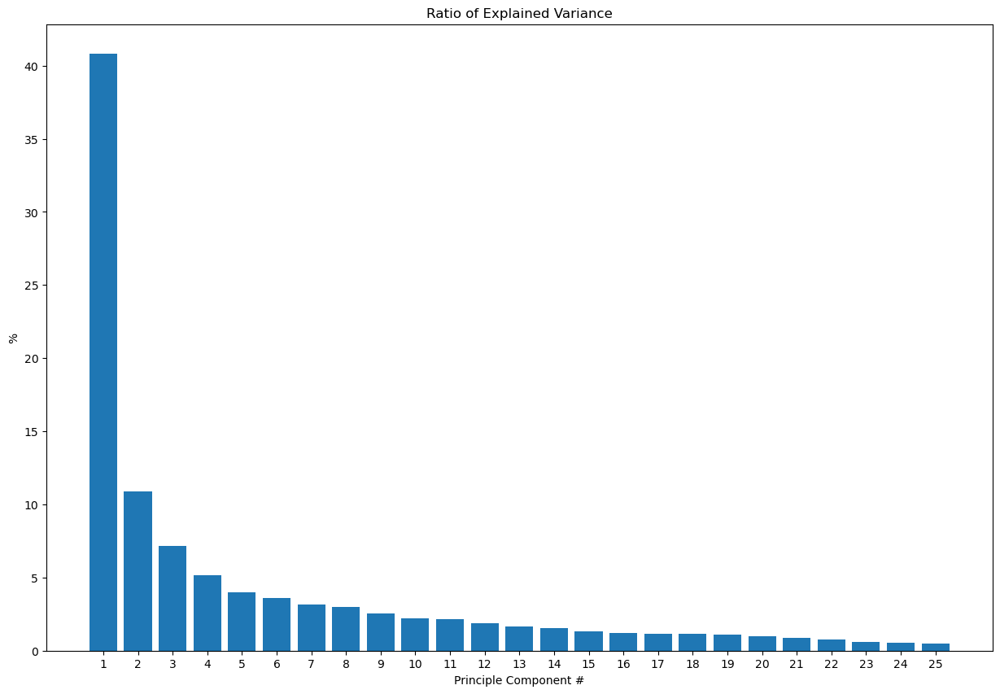

In [115]:
components = [str(x+1) for x in range(pca.n_components_)]
explained_variance_pct = pca.explained_variance_ratio_ * 100

plt.figure(figsize=(15, 10))
plt.bar(components, explained_variance_pct)
plt.title("Ratio of Explained Variance")
plt.xlabel("Principle Component #")
plt.ylabel("%")
plt.show()

In [116]:
pca.components_[0,:]

array([0.31150682, 0.19717105, 0.19091874, 0.12903511, 0.27366348,
       0.20179351, 0.17278905, 0.14830163, 0.22358811, 0.20403269,
       0.23474747, 0.18874542, 0.20261934, 0.2050633 , 0.09090489,
       0.11484738, 0.21535257, 0.19448486, 0.3059092 , 0.08865975,
       0.17163869, 0.3067361 , 0.14142997, 0.07155072, 0.14934202])

위 결과를 볼때, 나름대로 연결성은 있는듯?

In [117]:
first_comp = pca.components_[0,:]

highest = ticks[abs(first_comp).argmax()]
lowest = ticks[abs(first_comp).argmin()]
print(f'The highest-absolute-weighing asset: {highest}\nThe lowest-absolute-weighing asset: {lowest}')

The highest-absolute-weighing asset: ATVI
The lowest-absolute-weighing asset: AAL


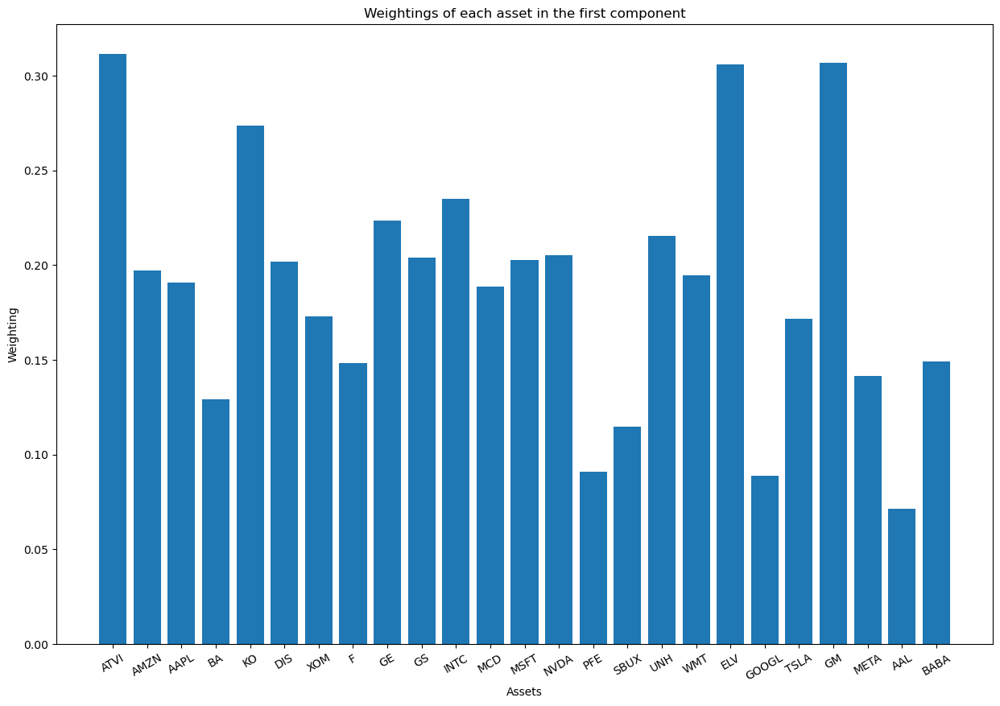

In [118]:
plt.figure(figsize=(15, 10))
plt.bar(ticks, first_comp)
plt.title("Weightings of each asset in the first component")
plt.xlabel("Assets")
plt.ylabel("Weighting")
plt.xticks(rotation=30)
plt.show()

In [119]:
df_close[[highest, lowest]]

,ATVI,AAL
Date,,
2014-09-19,20.655457,34.620152
2014-09-22,20.532394,33.627762
2014-09-23,20.144278,33.391479
2014-09-24,20.078014,34.138138
2014-09-25,19.888687,33.278065
...,...,...
2022-11-14,73.959999,14.680000
2022-11-15,73.879997,14.610000
2022-11-16,74.349998,14.090000


In [120]:
log_price = np.log(df_close[[highest, lowest]])

In [126]:
coint_reg = engle_granger(log_price.iloc[:,0], log_price.iloc[:,1], trend='c', lags=1)
display(coint_reg)

Test Statistic,-2.576
P-value,0.247
ADF Lag length,1
Estimated Root ρ (γ+1),0.995


In [128]:
coint_reg.cointegrating_vector

ATVI     1.000000
AAL      0.556008
const   -5.818938
dtype: float64

In [127]:
coint_vector = coint_reg.cointegrating_vector[:2]

In [129]:
spread = log_price @ coint_vector

In [133]:
pvalue = adfuller(spread, maxlag=0)[1]
print(f"The ADF test p-value is {pvalue}, so it is {'' if pvalue < 0.05 else 'not '}stationary.")

The ADF test p-value is 0.10242745720064139, so it is not stationary.


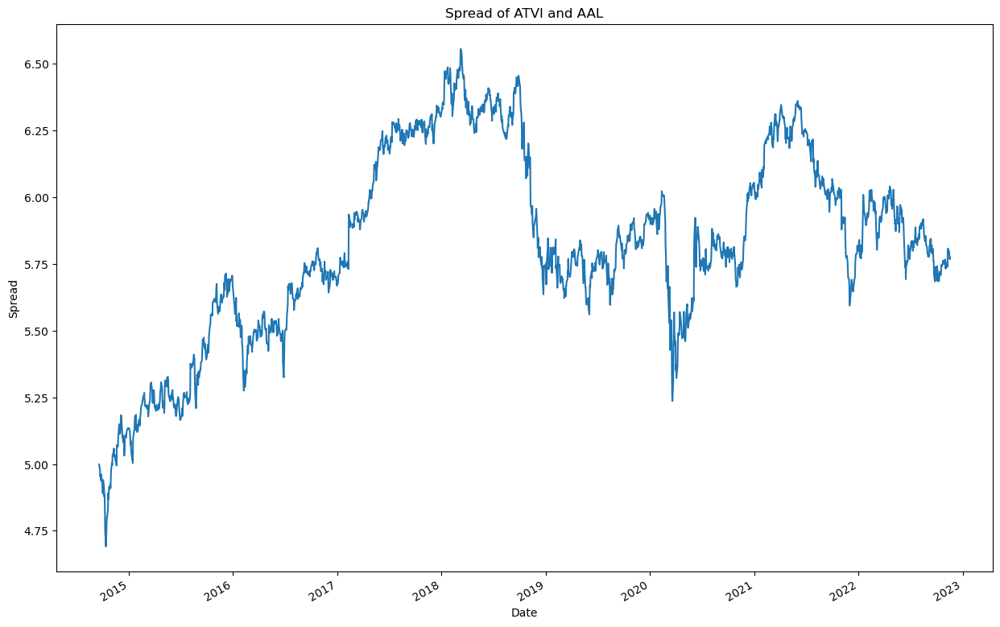

In [134]:
spread.plot(figsize=(15, 10), title=f"Spread of {highest} and {lowest}")
plt.ylabel("Spread")
plt.show()

In [16]:
df_corr.head()

,AAL,AAPL,AMZN,ATVI,BA,BABA,DIS,ELV,F,GE,...,MCD,META,MSFT,NVDA,PFE,SBUX,TSLA,UNH,WMT,XOM
AAL,1.000000,0.002038,-0.024495,0.005764,-0.005353,0.007032,0.003851,0.008385,-0.000947,-0.001623,...,0.013886,-0.013496,-0.019201,0.004812,-0.011946,-0.021922,-0.007946,-0.000733,0.005995,0.013330
AAPL,0.002038,1.000000,-0.000803,0.006040,0.012954,-0.007422,-0.000303,-0.002442,0.031913,0.011842,...,-0.009803,-0.039388,-0.002082,-0.001071,0.028802,-0.011254,-0.014630,-0.030800,0.008110,-0.018404
AMZN,-0.024495,-0.000803,1.000000,0.029586,-0.006317,-0.001438,0.004077,0.004280,-0.000597,0.001371,...,0.002366,-0.041318,-0.026657,0.003403,0.008383,0.025288,-0.001341,-0.001712,0.041288,0.017344
ATVI,0.005764,0.006040,0.029586,1.000000,-0.021386,-0.023354,-0.083801,0.001215,-0.002433,0.005926,...,0.019078,0.004793,-0.001247,-0.052119,-0.007110,0.010781,-0.001306,-0.000248,0.029719,-0.034228
BA,-0.005353,0.012954,-0.006317,-0.021386,1.000000,-0.002608,0.070339,-0.003558,0.000138,0.001481,...,-0.000974,0.012108,0.028400,0.009231,0.013836,0.005778,0.000579,0.017171,0.007459,-0.003870


In [71]:
#eig = np.linalg.eigvals(df_corr)
eig = np.sort(np.linalg.eigvals(df_corr))

In [72]:
eig

array([0.63928814, 0.77238052, 0.77740353, 0.82946852, 0.85158638,
       0.87098916, 0.90567988, 0.92229447, 0.94496813, 0.95094063,
       0.96641158, 0.97423081, 0.98057909, 1.00183507, 1.01011454,
       1.02386099, 1.03344251, 1.04955743, 1.09438172, 1.11219679,
       1.12606519, 1.14524165, 1.2381906 , 1.2922484 , 1.48664427])

In [73]:
eig_mat = np.eye(25,k=0) * eig

In [74]:
np.dot(np.dot(df, eig_mat).T, df) - df_corr

,AAL,AAPL,AMZN,ATVI,BA,BABA,DIS,ELV,F,GE,...,MCD,META,MSFT,NVDA,PFE,SBUX,TSLA,UNH,WMT,XOM
AAL,0.474272,0.249825,0.240212,0.091500,0.663025,0.287312,0.350153,0.226853,0.526790,0.456124,...,0.170332,0.268589,0.253610,0.378111,0.132653,0.324073,0.401231,0.204598,0.053026,0.277684
AAPL,0.302260,-0.444224,0.360075,0.242781,0.316497,0.305619,0.235724,0.219557,0.214041,0.223298,...,0.182079,0.422762,0.370192,0.514631,0.116251,0.265278,0.467460,0.258925,0.132298,0.199766
AMZN,0.286817,0.362412,-0.303018,0.252590,0.273398,0.344286,0.221273,0.156371,0.207054,0.177064,...,0.133061,0.494572,0.411588,0.521472,0.104470,0.225863,0.476270,0.185371,0.081168,0.115238
ATVI,0.120434,0.261172,0.271488,-0.254688,0.219015,0.285979,0.209060,0.151094,0.107050,0.116416,...,0.081508,0.288285,0.285527,0.452823,0.110352,0.146896,0.315919,0.154728,0.074988,0.146670
BA,0.881429,0.350282,0.298884,0.224285,0.216210,0.343886,0.350762,0.333715,0.543099,0.579749,...,0.275913,0.338776,0.304080,0.489013,0.170357,0.382128,0.516805,0.279634,0.113784,0.423952
BABA,0.393993,0.343689,0.385559,0.299125,0.351662,0.229034,0.234547,0.196524,0.295230,0.248365,...,0.129198,0.385735,0.325800,0.542226,0.107788,0.260766,0.522552,0.146393,0.080867,0.178508
DIS,0.497667,0.276353,0.258457,0.220569,0.377511,0.244112,-0.430353,0.206869,0.371375,0.333773,...,0.196169,0.286085,0.282261,0.369598,0.126658,0.312191,0.353609,0.255083,0.066897,0.267047
ELV,0.330991,0.261698,0.186313,0.168139,0.361128,0.206735,0.210786,-0.310632,0.275801,0.283700,...,0.209566,0.243238,0.266546,0.320065,0.238818,0.272737,0.236472,0.504467,0.106531,0.245136
F,0.778226,0.268999,0.251554,0.121617,0.602669,0.320122,0.387281,0.282639,-0.019862,0.514401,...,0.235904,0.327151,0.275904,0.472123,0.133133,0.346294,0.483853,0.258554,0.113984,0.369983
GE,0.677692,0.277658,0.216895,0.134332,0.647560,0.271086,0.350604,0.292498,0.517656,0.016526,...,0.219542,0.281353,0.266591,0.398816,0.187570,0.320382,0.380096,0.258246,0.096726,0.410155


In [57]:
shape

NameError: name 'shape' is not defined

In [31]:
(df @ eig_mat) @ np.transpose(df)

ValueError: matrices are not aligned